In [1]:
import numpy as np
import random
import time
import math
import random
import os
import sys
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt

# Notebook path
current_directory = os.getcwd()
# Get one behind for calling the other modules
root_directory = os.path.abspath(os.path.join(current_directory, '..'))
sys.path.append(root_directory)

#Network and measures
from to_get_data.net_construction_vis_measures import *

from to_get_data.generate_database import *
#Agrobiodiversity
from to_get_data.agrobiodiversity_data import *

from model_class.Variety import Variety
from model_class.UD import *

In [2]:
## CLase UD_restricted
## IMPORTANT: The class "select_new_ud" is the one that applies the weight according to clan and community. 
## The weight can be changed to represent a spectrum of exogamy rules. It means how much importance do you give
## To the clan or community differences

#This particular Class is used to set a limit in the number of UD on the model 0,1,2,3,7
###Relações na lista de parentes
#0. Pais do homem [0]
#1. Pais da mulher [1]
#2. Filhos [2]
#3. Avos [3] 
#4. Irmãos [4]
#5. Tios [5]
#6. Primos [6]
#7. Netos [7]
#8. Sobrinhos [8]
#9. Cassais passados [9]



class UD_restricted:
    ## CLase UD_restricted
    ## IMPORTANT: The class "select_new_ud" is the one that applies the weight according to clan and community. 
    ## The weight can be changed to represent a spectrum of exogamy rules. It means how much importance do you give
    ## To the clan or community differences
    ## A restrcited system defines the clan of your possible partner. In this sense, the function restrict is used.
    
    uds = {}

    def __init__(self, id_ud, media, community, clan):
        self.id = id_ud
        self.parentes = [None]*10
        self.age = 1
        self.filhos = [None] * (np.random.poisson(media))
        self.activa = True 
        self.varieties = []
        self.community = community
        self.clan = clan
        self.uds[id_ud] = self

    def ter_filho(self):
        # Tem espaco para ter filhos?, aleatoriamente para nao ter filhos todo ano. 
        if None in self.filhos and random.random() <= 0.3:
            # Coloca o filho no primeiro None
            for i in range(len(self.filhos)):
                if self.filhos[i] is None:
                    self.filhos[i] = [random.choice([0, 1]), 0] #[sexo, idade] e no sexo: 0 é feminino e 1 é masculino
                    break
        else:
            pass #print(f"Unidade {self.id} No tem para ter filhos!")

    def incrementar_idade(self):
        self.age += 1
        ## idade dos filhos no self.filhos
        for i in range(len(self.filhos)):
            if self.filhos[i] is not None:
                self.filhos[i][1] += 1
            else:
                break

    def death_probability(self, beta):
        alpha = 0.01
        delta = 0.00
        mortality_rate = alpha * math.exp(beta * (self.age)) + delta

        if random.random() < mortality_rate:
            self.activa = False

    def buscar_ud(self, media, matrilinear, locality, inheritance): #To look and reproduce

        #Media: Mean of children for a Possion distribution
        #Matrilinear: determine the percentage of varieties that are going to pass to the next generation
        #Locality: True= Matrilocal, False=Patrilocal
        #Inheritance: True = Matrilinear, False= Patrilinear 
        
        #Function to determine the restricted exchange. Only 3 clans, True if is the allowed clan, else False
        def restrict(a,b):
            if b == (1 if a == 3 else a + 1):
                return True
            else:
                return False
        
        #Function to get a random couple       
        def select_new_ud (selected_ud, uds_disponiveis): #selected_ud es un objeto ud
            peso_clan, pes_com = 0.8 , 0.2
            if len(uds_disponiveis) != 0: #If there are possible mates
                probabilidad = np.zeros(len(uds_disponiveis))
                for i, obj in enumerate(uds_disponiveis):
                    clan_val = 0.9 if restrict(obj.clan, selected_ud.clan) else 0.1 #If allowed clan 0.9, else 0.1
                    com_val = 0.9 if obj.community == selected_ud.community else 0.1 #If same community 0.9, else 0.1
                    probabilidad[i] = clan_val*peso_clan + com_val*pes_com
                probabilidad = probabilidad / np.sum(probabilidad)
                choosen_ud = np.random.choice(uds_disponiveis, p=probabilidad)    
                return choosen_ud
            else:
                return False
        
        #Função para facilitar a busqueda de ids dentro da lista de parentes.
        def is_id_in_nested_lists(id_ud, nested_list):
            if id_ud in nested_list:
                return True
            for sublist in nested_list:
                if isinstance(sublist, list) and is_id_in_nested_lists(id_ud, sublist):
                    return True
            return False
        
        #Função para facilitar a busqueda de filhos segundo o sexo
        def filho_e_idade(self, sexo):
            for i in range(len(self.filhos)):
                filho = self.filhos[i]
                #Se o sexo é o que estamos procurando e se a idade é permitida para o casamento
                if filho is not None and filho[0] == sexo and filho[1] > 13:
                    return (True, i, filho[1])  # True, a posição e a idade
            return (False, None, None)  # False, None e None
        
        filha_disponivel, posição_filha, idade_filha = filho_e_idade(self, 0) #Se a unidade tem uma filha disponivel para procurar esposa
        if filha_disponivel:
            uds_disponiveis = [ud for id_ud, ud in self.uds.items() if
                    id_ud != self.id and #Que a UD não seja self
                    not is_id_in_nested_lists(id_ud, [self.parentes[i] for i in [0, 1, 2, 3, 7]]) and # Que a UD não seja um parent
                    filho_e_idade(ud,1)[0] and #Que tenha um filho
                    abs(filho_e_idade(ud,1)[2] - idade_filha) <= 15 #Que a diferença entre as idades não seja maior a 10
                      ]
            new_couple = select_new_ud(self, uds_disponiveis)
            
            if new_couple:
                cassal_id = new_couple.id
                filho_disponivel, posição_filho, idade_filho = filho_e_idade(UD_restricted.uds[cassal_id], 1)
                #print(filho_disponivel, posição_filho, idade_filho)
                #Agregar no espaço de casais passados [9]
                if self.parentes[9] is None: 
                    # Se a lista não existe, cria uma nova com esse id
                    self.parentes[9] = [cassal_id]
                else:
                    # Se a lista já existe, só agrega o id
                    self.parentes[9].append(cassal_id)
                if self.uds[cassal_id].parentes[9] is None: 
                    # Se a lista não existe, cria uma nova com esse id
                    self.uds[cassal_id].parentes[9] = [self.id]
                else:
                    # Se a lista já existe, só agrega o id
                    self.uds[cassal_id].parentes[9].append(self.id)   

                #### Criar um novo filho e asignar os parentes
                novo_id = max(self.uds) + 1
                if locality == True:
                    if inheritance == True:
                        novo_nodo = UD_restricted(novo_id, media, self.community, self.clan) # Matrilocal and matrilineal
                    else:
                        novo_nodo = UD_restricted(novo_id, media, self.community, self.uds[cassal_id].clan) # Matrilocal and patrilineal
                else:
                    if inheritance == True:
                        novo_nodo = UD_restricted(novo_id, media, self.uds[cassal_id].community, self.clan) # Patrilocal and matrilineal
                    else:
                        novo_nodo = UD_restricted(novo_id, media, self.uds[cassal_id].community, self.uds[cassal_id].clan) # Patrilocal and patrilineal
                novo_nodo.parentes[0] = self.id   # Pais do homem [0]
                novo_nodo.parentes[1] = cassal_id # Pais da mulher [1] 
                
                #####Avos[3]
                # IDs do pai
                padre_self = self.parentes[0]
                madre_self = self.parentes[1]
                # IDs da mae
                pareja = self.uds[cassal_id]
                padre_pareja = pareja.parentes[0]
                madre_pareja = pareja.parentes[1]
                # Agregar os pais dos pais do novo_nodo como avos
                novo_nodo.parentes[3] = [valor for valor in [padre_self, madre_self, padre_pareja, madre_pareja] if valor is not None]
                ###Proceso de atualização: netos
                # Se novo_nodo tem avos 
                if None not in novo_nodo.parentes[3]:
                    # IDs dos avos de novo_nodo
                    abuelos_ids = novo_nodo.parentes[3]
                # Agregar aos avos o novo_nodo como neto.
                for abuelo_id in abuelos_ids:
                    if abuelo_id is not None:
                        abuelo = self.uds[abuelo_id]
                        if abuelo.parentes[7] is None:
                            abuelo.parentes[7] = [novo_nodo.id]
                        else:
                            abuelo.parentes[7].append(novo_nodo.id)
                
                #### Irmãos [4]
                hermanos_ids = []
                if novo_nodo.parentes[0] is not None:
                    # Filhos dos pais do novo_nodo (irmãos por parte do pai)
                    padre_nuevo = self.uds[novo_nodo.parentes[0]]
                    if padre_nuevo.parentes[2] is not None:
                        hermanos_ids.extend(padre_nuevo.parentes[2])
                if novo_nodo.parentes[1] is not None:
                    # Filhos dos pais do novo_nodo (irmãos por parte da mãe)
                    madre_nuevo = self.uds[novo_nodo.parentes[1]]
                    if madre_nuevo.parentes[2] is not None:
                        hermanos_ids.extend(madre_nuevo.parentes[2])
                # Não ter o id de novo_nodo como irmão
                hermanos_ids = [hermano_id for hermano_id in hermanos_ids if hermano_id != novo_nodo.id]
                # Agregar aos irmãos de novo_nodo
                novo_nodo.parentes[4] = hermanos_ids
                
                ##Proceso de atualização: irmãos
                # ID de novo_nodo nos irmãos existentes
                for hermano_id in hermanos_ids:
                    hermano = self.uds[hermano_id]
                    if hermano.parentes[4] is None:
                        hermano.parentes[4] = [novo_nodo.id]
                    else:
                        hermano.parentes[4].append(novo_nodo.id)
                #####Tios[5]
                # IDs dos avos de novo_nodo
                abuelos_ids = novo_nodo.parentes[3]
                
                # Iterar nos avos para encontrar os tios
                tios_ids = [hermano_id for abuelo_id in abuelos_ids if abuelo_id is not None
                            for hermano_id in self.uds[abuelo_id].parentes[2] if hermano_id is not None
                            if hermano_id != novo_nodo.parentes[0] and hermano_id != novo_nodo.parentes[1]]
                # Agregar os IDs dos tios no novo_nodo
                novo_nodo.parentes[5] = tios_ids
                
                ##Proceso de atualização: sobrinhos
                # Actualizar os sobrinhos dos tios.
                for tio_id in tios_ids:
                    if tio_id is not None:
                        tio = self.uds[tio_id]
                        if tio.parentes[8] is None:
                            # Se não existe, cria lisa com o id de novo_nodo
                            tio.parentes[8] = [novo_nodo.id]
                        else:
                            # Se existe, agregar o id de novo_nodo
                            tio.parentes[8].append(novo_nodo.id)
                
                #### Primos[6]
                primos_ids = [primo_id for tio_id in tios_ids if tio_id is not None
                            for tio in [self.uds[tio_id]] if tio.parentes[2] is not None
                            for primo_id in tio.parentes[2] if primo_id is not None and primo_id != novo_nodo.id]

                # Agregar os IDs dos primos no novo_nodo
                novo_nodo.parentes[6] = primos_ids
                
                ##Proceso de atualização: sobrinhos
                for primo_id in primos_ids:
                    if primo_id is not None:
                        primo = self.uds[primo_id]
                        if primo.parentes[6] is None:
                            # Se não existe, cria lisa com o id de novo_nodo
                            primo.parentes[6] = [novo_nodo.id]
                        else:
                            # Se existe, agregar o id de novo_nodo
                            primo.parentes[6].append(novo_nodo.id)
                            
                ####Sobrinos[8] 
                sobrinos_ids = [sobrino_id for hermano_id in hermanos_ids if hermano_id is not None
                                for hermano in [self.uds[hermano_id]] if hermano.parentes[2] is not None
                                for sobrino_id in hermano.parentes[2] if sobrino_id is not None and sobrino_id != novo_nodo.id]

                # Agregar os IDs dos sobrinhos no novo_nodo
                novo_nodo.parentes[8] = sobrinos_ids
                
                ##Proceso de atualização: tios
                for sobrino_id in sobrinos_ids:
                    if sobrino_id is not None:
                        sobrino = self.uds[sobrino_id]
                        if sobrino.parentes[5] is None:
                            # Se não existe, cria lisa com o id de novo_nodo
                            sobrino.parentes[5] = [novo_nodo.id]
                        else:
                            # Se existe, agregar o id de novo_nodo
                            sobrino.parentes[5].append(novo_nodo.id)
                            
                            
                ### Eliminar os filhos utilizados no processo
                self.filhos.pop(posição_filha)
                self.uds[cassal_id].filhos.pop(posição_filho)
                
                # colcoar o novo filho dos pais
                if self.parentes[2] is None:
                    self.parentes[2] = [novo_id]
                else:
                    self.parentes[2].append(novo_id)
                if self.uds[cassal_id].parentes[2] is None:
                    self.uds[cassal_id].parentes[2] = [novo_id]
                else:
                    self.uds[cassal_id].parentes[2].append(novo_id)
                
                # Herdar sementes
                novo_nodo.heredar(matrilinear)
                
                #return None
            else:
                #print(f"UD {self.id} não achou cassal.")
                return None

        else:
            #print(f"UD {self.id} não achou ninguem")
            return None

    def heredar(self, matrilinear): #Metodo da herança de sementes.
        vm = UD_restricted.uds[self.parentes[1]].varieties
        vp = UD_restricted.uds[self.parentes[0]].varieties
        heredar_mae = math.ceil((matrilinear * len(vm))/100)
        heredar_pai = math.ceil(((100-matrilinear) * len(vp))/100)
        vari_mae = vm[0:heredar_mae] #as primeiras variedades
        vari_pai = vp[0:heredar_pai] #as primeiras variedades
        # Heredar as variedades
        self.varieties.extend(vari_mae + vari_pai)

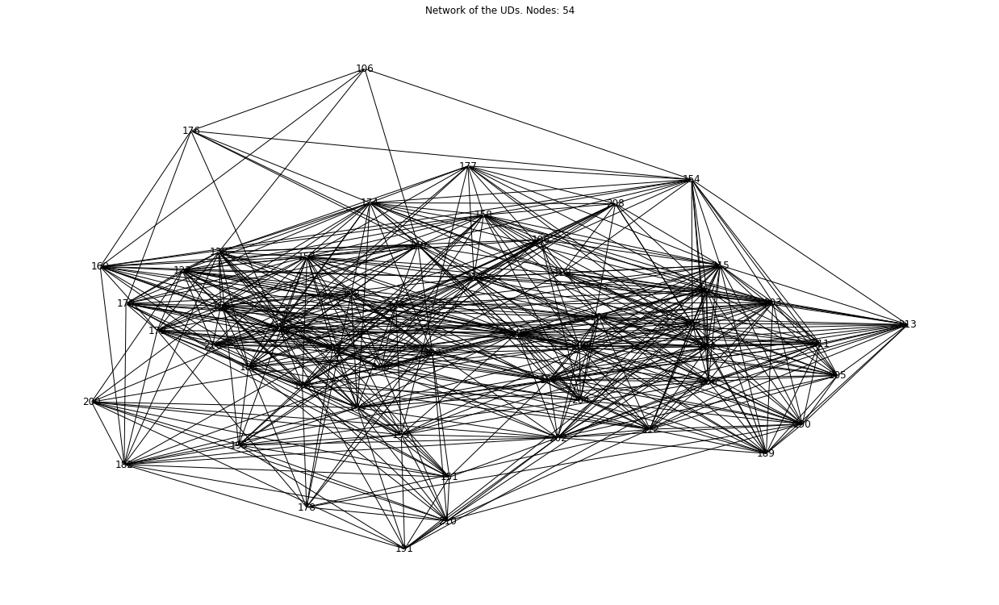

Betweenness Centrality:
{145: 0.028602933671949902, 202: 0.027151988328682684, 197: 0.024342090640771728, 152: 0.024112934982457538, 149: 0.023729262147775633, 199: 0.021281553061206486, 174: 0.02042590600020241, 207: 0.02035674740927451, 138: 0.020022938529636353, 214: 0.019581316819720935}

Closeness Centrality:
{145: 0.726027397260274, 152: 0.6883116883116883, 209: 0.6883116883116883, 215: 0.6794871794871795, 207: 0.6708860759493671, 199: 0.6708860759493671, 214: 0.6708860759493671, 157: 0.6708860759493671, 193: 0.6708860759493671, 194: 0.6708860759493671}

Degree Centrality:
{145: 0.6226415094339622, 152: 0.5471698113207547, 209: 0.5471698113207547, 207: 0.5283018867924528, 215: 0.5283018867924528, 202: 0.5094339622641509, 199: 0.5094339622641509, 214: 0.5094339622641509, 157: 0.5094339622641509, 193: 0.5094339622641509}

Eigenvector Centrality:
{145: 0.21814289639033813, 209: 0.1985877627962052, 207: 0.1903147400990366, 215: 0.18678119707360064, 157: 0.1823187917148253, 193: 0.179

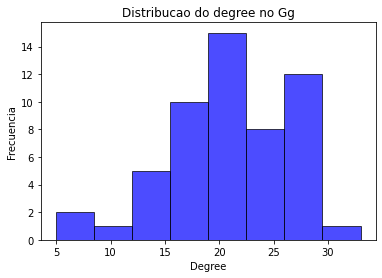

Densidade: 0.39063591893780575
Número de nós: 54
Número de aristas: 559
Diámetro: 3
Transitividade: 0.5853535353535354
Average shorthest path: 1.623340321453529
Coeficiente de Clustering Promedio (cluster maior): 0.6004459518371696
----------------------------


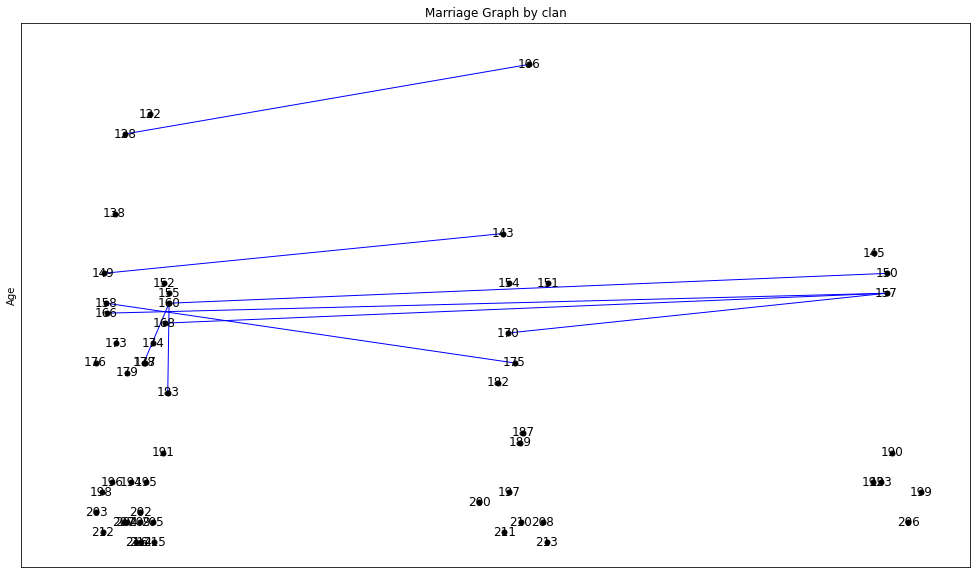

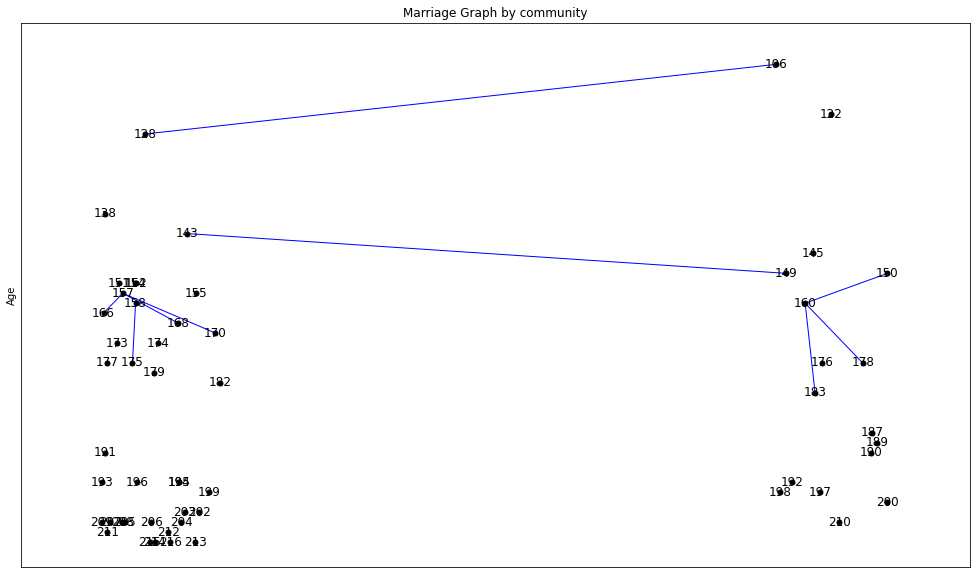

Total de enlaces: 9
Links inside the clan '1': 22.22%
Linkgs outside the clan '2' and '1': 22.22%
Linkgs outside the clan '3' and '1': 33.33%
Linkgs outside the clan '3' and '2': 11.11%
Linkgs outside the clan '1' and '2': 11.11%
Total de enlaces: 9
Links inside the community '2': 33.33%
Links inside the community '1': 44.44%
Linkgs outside the community '2' and '1': 11.11%
Linkgs outside the community '1' and '2': 11.11%


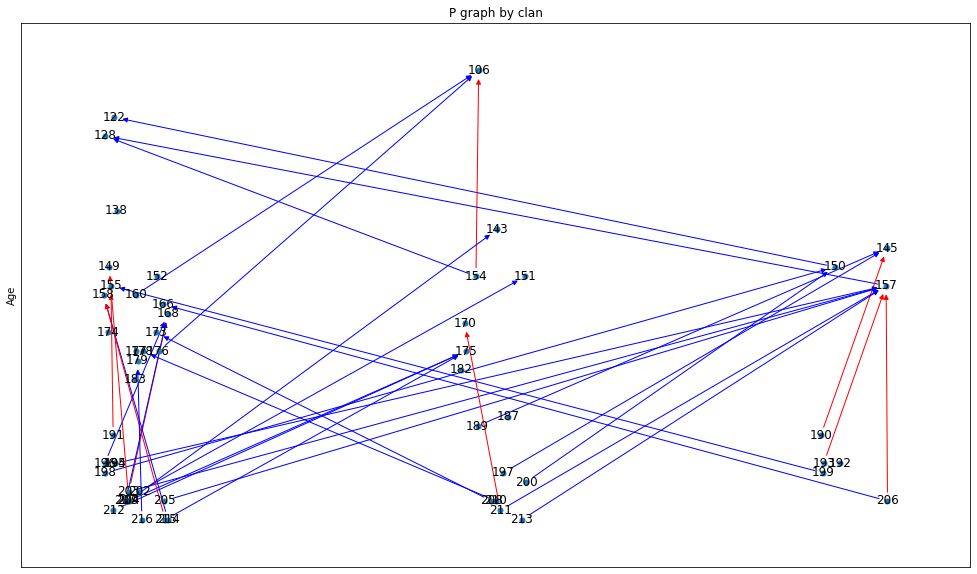

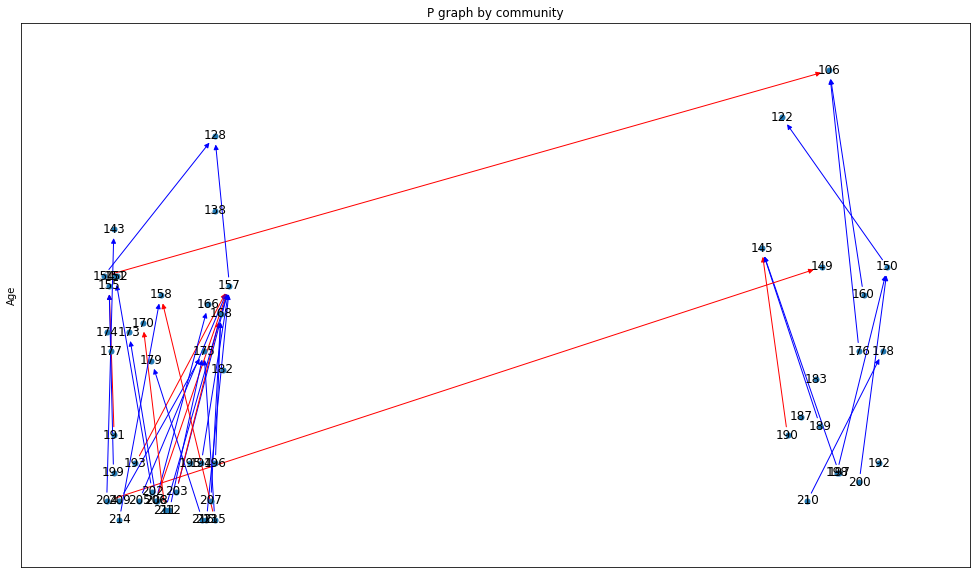

tamos en tiempo 100 con vivas 51


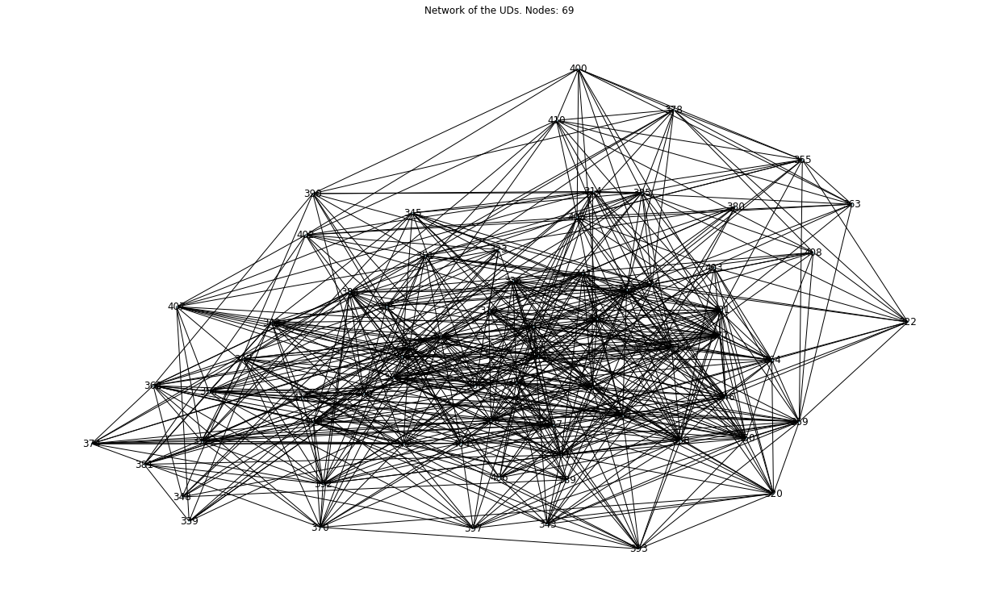

Betweenness Centrality:
{398: 0.03216536104072298, 368: 0.03098430588251882, 396: 0.030893297708928756, 326: 0.0307068418736032, 404: 0.029286677033521048, 409: 0.029194740715085925, 401: 0.02585196037570094, 384: 0.02551556685021502, 399: 0.024110709946931985, 382: 0.022198256688625125}

Closeness Centrality:
{398: 0.6476190476190476, 396: 0.6415094339622641, 395: 0.6355140186915887, 391: 0.6355140186915887, 368: 0.6296296296296297, 382: 0.6296296296296297, 394: 0.6238532110091743, 358: 0.6238532110091743, 401: 0.6238532110091743, 326: 0.6126126126126126}

Degree Centrality:
{398: 0.45588235294117646, 396: 0.4411764705882353, 395: 0.4411764705882353, 382: 0.4411764705882353, 391: 0.4264705882352941, 394: 0.4117647058823529, 368: 0.4117647058823529, 401: 0.4117647058823529, 358: 0.39705882352941174, 371: 0.38235294117647056}

Eigenvector Centrality:
{395: 0.2103605643778182, 382: 0.2088987421372106, 398: 0.20749628243959004, 391: 0.20466193534382865, 396: 0.20079905382773533, 394: 0.19

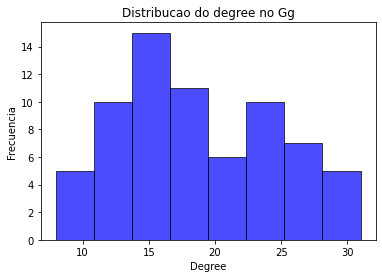

Densidade: 0.2749360613810742
Número de nós: 69
Número de aristas: 645
Diámetro: 3
Transitividade: 0.5404298874104401
Average shorthest path: 1.7924126172208015
Coeficiente de Clustering Promedio (cluster maior): 0.5590159342297166
----------------------------


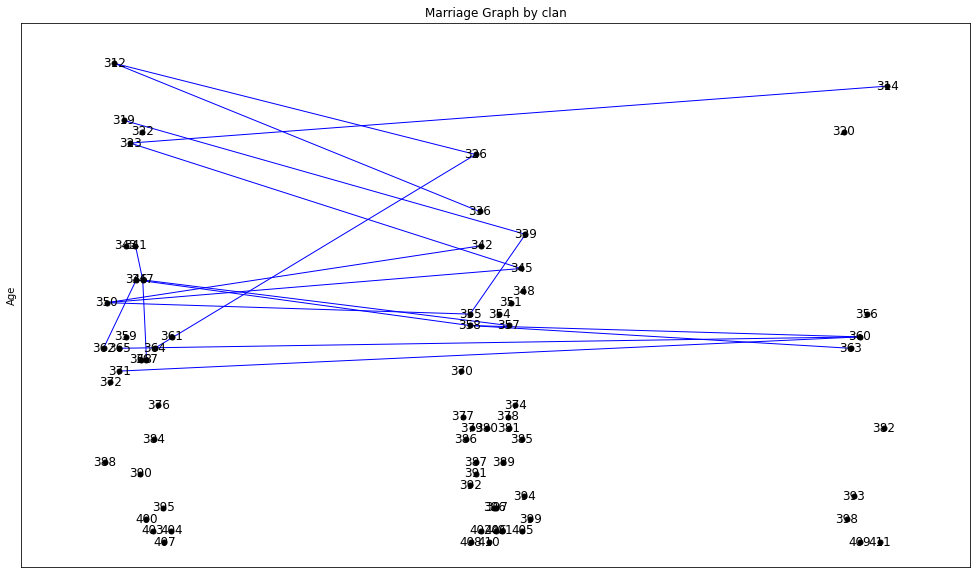

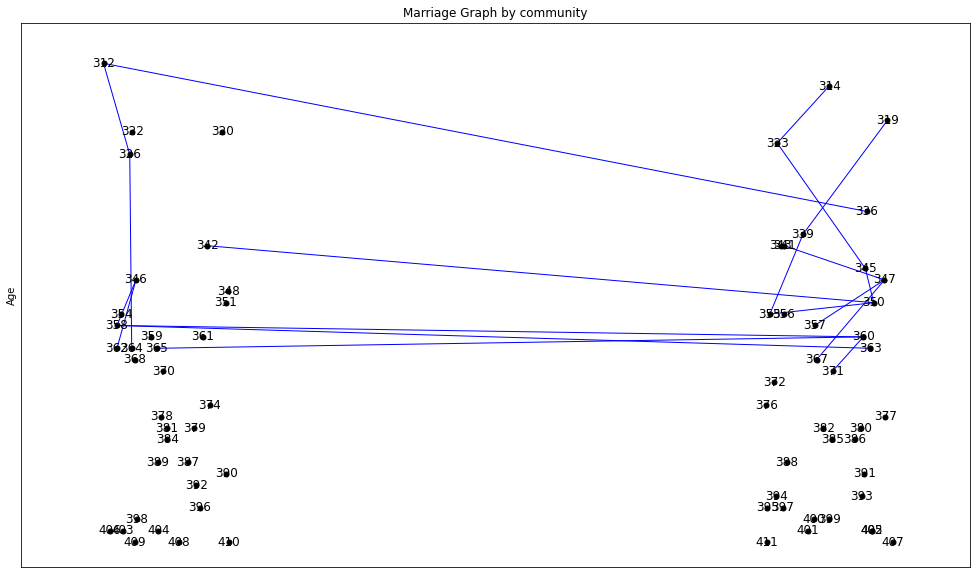

Total de enlaces: 19
Links inside the clan '2': 5.26%
Links inside the clan '1': 15.79%
Linkgs outside the clan '1' and '2': 36.84%
Linkgs outside the clan '3' and '1': 15.79%
Linkgs outside the clan '2' and '1': 15.79%
Linkgs outside the clan '2' and '3': 10.53%
Total de enlaces: 19
Links inside the community '1': 21.05%
Links inside the community '2': 52.63%
Linkgs outside the community '1' and '2': 21.05%
Linkgs outside the community '2' and '1': 5.26%


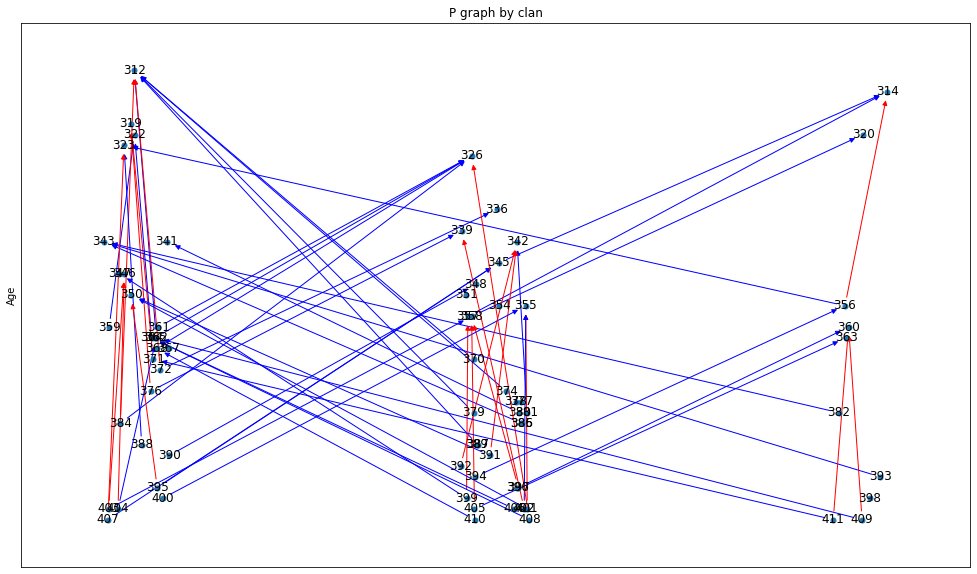

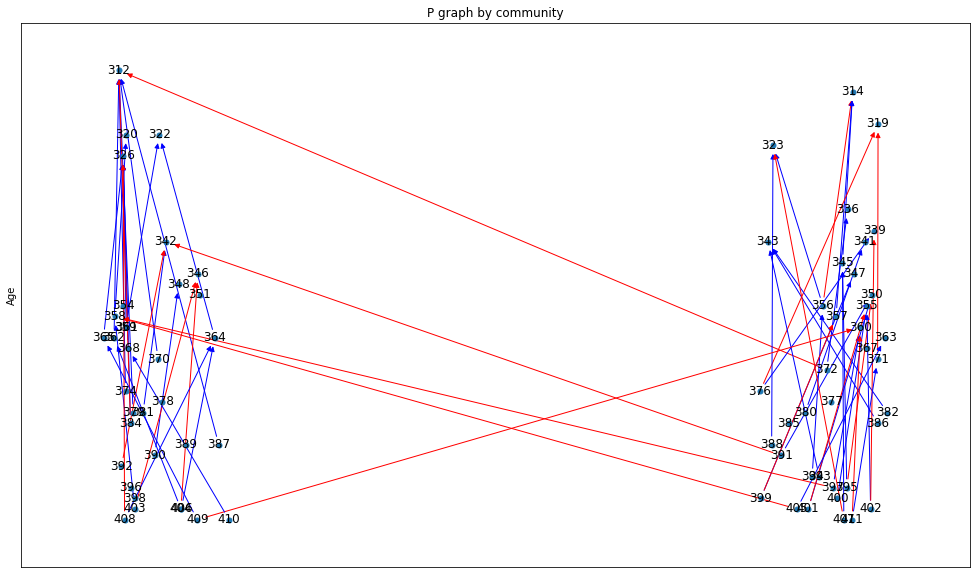

tamos en tiempo 200 con vivas 66


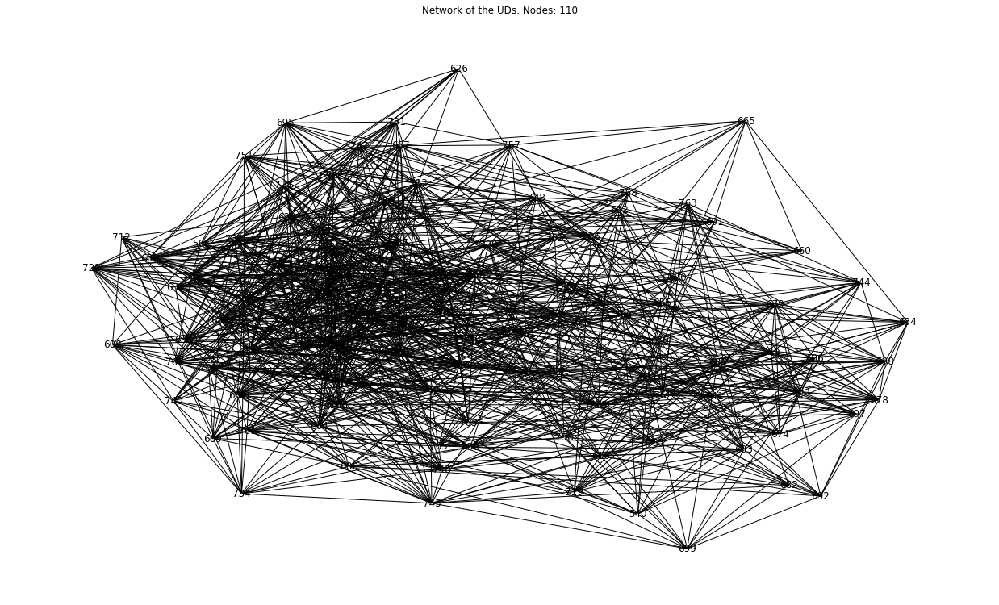

Betweenness Centrality:
{701: 0.032391223365384504, 646: 0.027531548468797164, 724: 0.02167227627633178, 766: 0.018156283637164938, 681: 0.0181262312432596, 675: 0.016874680948175094, 725: 0.015186165499288393, 739: 0.015113175334315488, 764: 0.014654750077322897, 661: 0.014496519531792373}

Closeness Centrality:
{701: 0.615819209039548, 658: 0.6055555555555555, 646: 0.5989010989010989, 675: 0.592391304347826, 681: 0.5891891891891892, 667: 0.5891891891891892, 625: 0.5860215053763441, 742: 0.5860215053763441, 739: 0.5828877005347594, 716: 0.5767195767195767}

Degree Centrality:
{701: 0.3761467889908257, 646: 0.3486238532110092, 658: 0.3486238532110092, 675: 0.3211009174311927, 681: 0.3211009174311927, 667: 0.3119266055045872, 625: 0.30275229357798167, 739: 0.30275229357798167, 716: 0.29357798165137616, 742: 0.29357798165137616}

Eigenvector Centrality:
{658: 0.20244967312124884, 701: 0.19335701880943645, 625: 0.18238384518375889, 716: 0.17925283654525717, 681: 0.1752306616147572, 739: 0

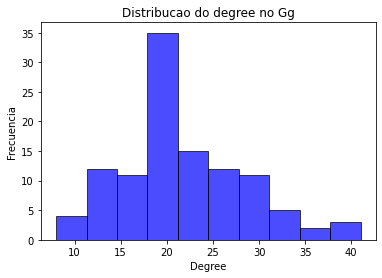

Densidade: 0.19899916597164305
Número de nós: 110
Número de aristas: 1193
Diámetro: 3
Transitividade: 0.4781884781884782
Average shorthest path: 1.881234361968307
Coeficiente de Clustering Promedio (cluster maior): 0.48552764094464884
----------------------------


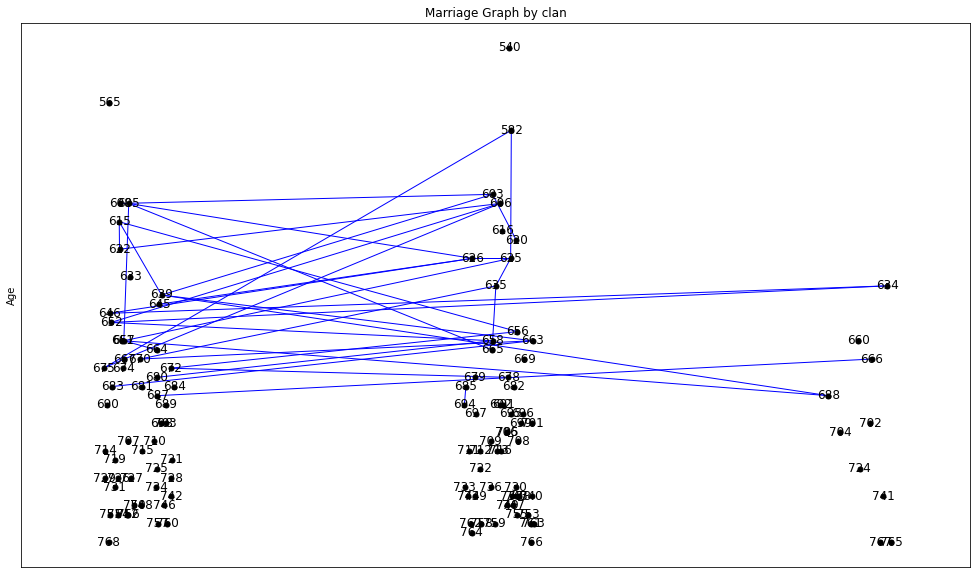

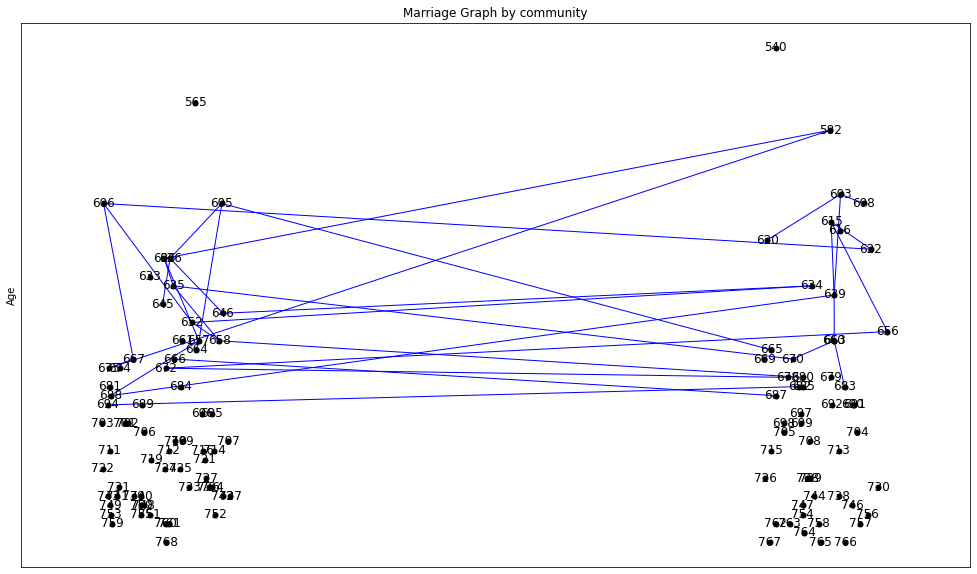

Total de enlaces: 36
Links inside the clan '2': 16.67%
Links inside the clan '1': 13.89%
Linkgs outside the clan '2' and '1': 38.89%
Linkgs outside the clan '1' and '2': 16.67%
Linkgs outside the clan '3' and '1': 8.33%
Linkgs outside the clan '1' and '3': 5.56%
Total de enlaces: 36
Links inside the community '2': 25.00%
Links inside the community '1': 38.89%
Linkgs outside the community '2' and '1': 19.44%
Linkgs outside the community '1' and '2': 16.67%


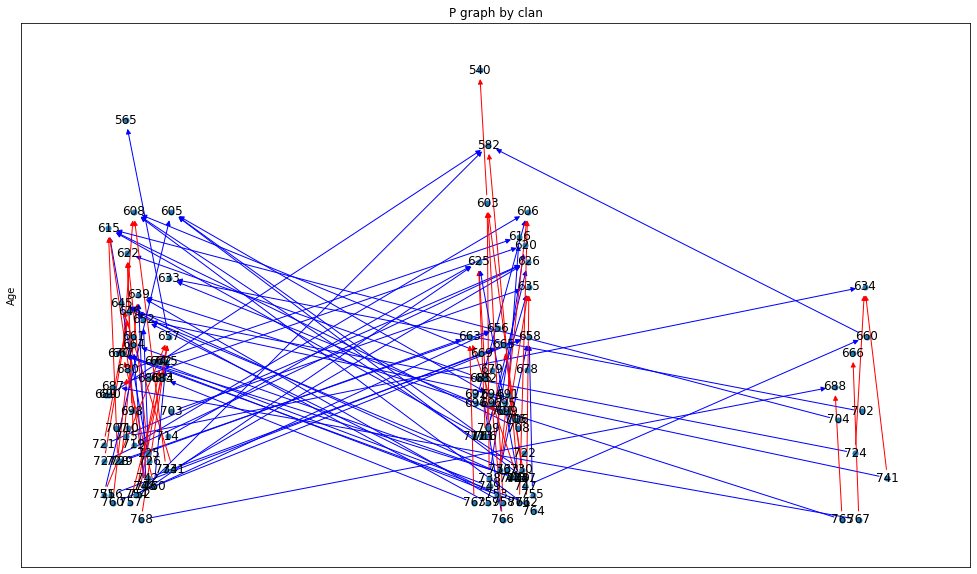

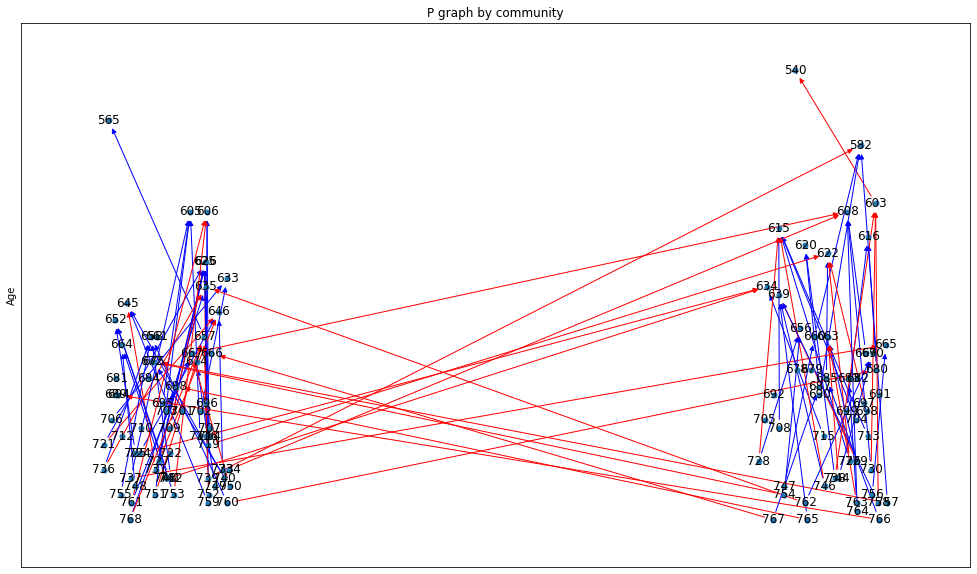

tamos en tiempo 300 con vivas 112


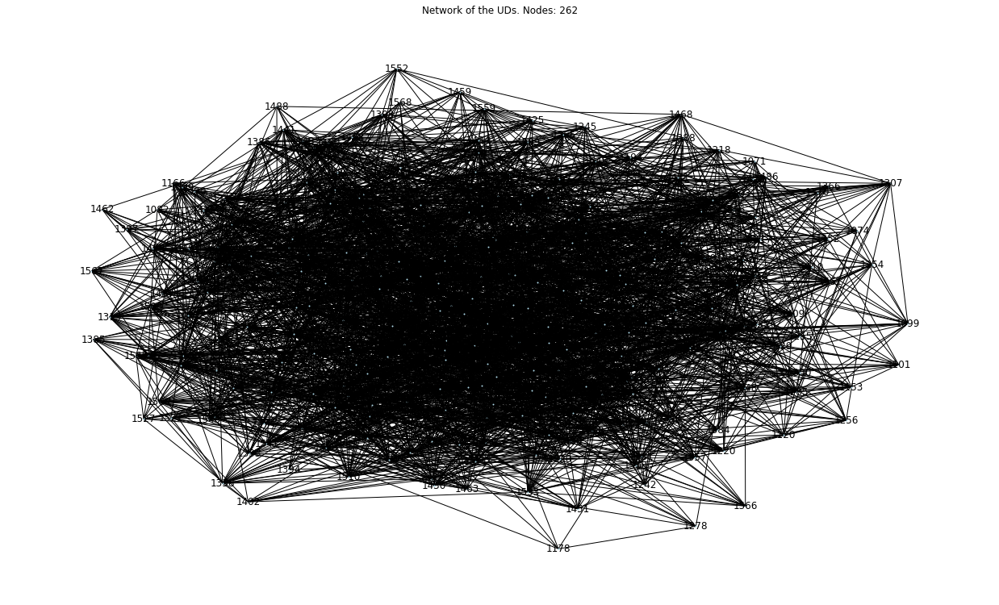

Betweenness Centrality:
{1310: 0.01536056078103334, 1305: 0.014551321227736348, 1347: 0.014090308896733392, 1404: 0.0138670652641929, 1529: 0.012024980278327022, 1321: 0.01189148411552185, 1537: 0.01117491649065663, 1555: 0.011155710361658834, 1382: 0.01095326190384529, 1517: 0.010210477254330505}

Closeness Centrality:
{1310: 0.5483193277310925, 1347: 0.5483193277310925, 1404: 0.5483193277310925, 1305: 0.54375, 1517: 0.5381443298969072, 1550: 0.5370370370370371, 1321: 0.5359342915811088, 1424: 0.5348360655737705, 1529: 0.5326530612244897, 1336: 0.5304878048780488}

Degree Centrality:
{1347: 0.210727969348659, 1404: 0.210727969348659, 1305: 0.20306513409961685, 1310: 0.20306513409961685, 1321: 0.18773946360153257, 1424: 0.1839080459770115, 1550: 0.1839080459770115, 1517: 0.18007662835249041, 1537: 0.17624521072796934, 1427: 0.16858237547892718}

Eigenvector Centrality:
{1347: 0.14879923418914817, 1404: 0.14099078117381433, 1310: 0.13410148915542636, 1305: 0.1296954814552108, 1424: 0.12

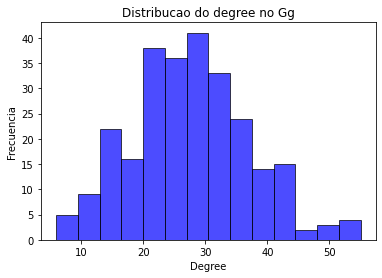

Densidade: 0.10499839138954696
Número de nós: 262
Número de aristas: 3590
Diámetro: 4
Transitividade: 0.40746546027932123
Average shorthest path: 2.1156737153051974
Coeficiente de Clustering Promedio (cluster maior): 0.4170328683008504
----------------------------


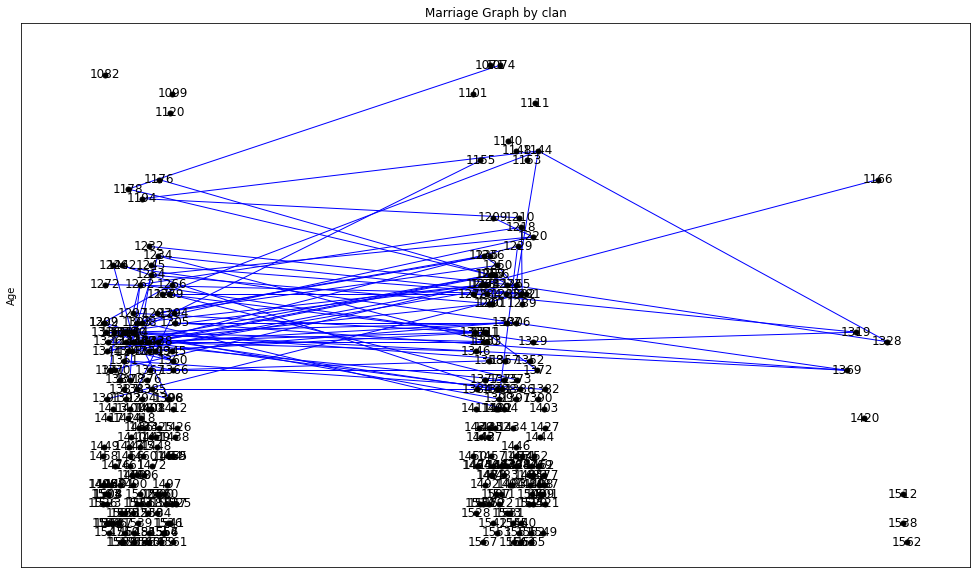

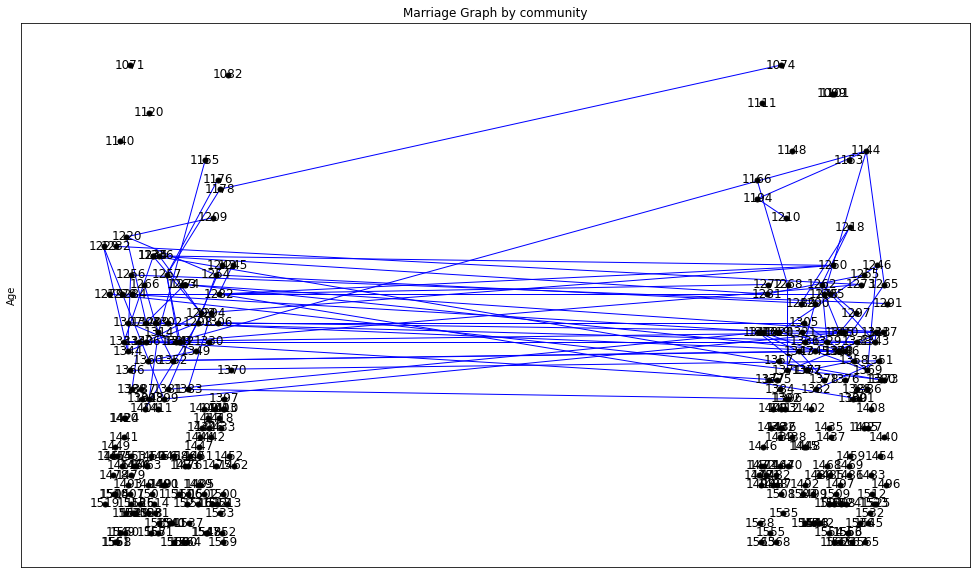

Total de enlaces: 95
Links inside the clan '2': 10.53%
Links inside the clan '1': 23.16%
Linkgs outside the clan '2' and '1': 29.47%
Linkgs outside the clan '2' and '3': 3.16%
Linkgs outside the clan '3' and '2': 2.11%
Linkgs outside the clan '1' and '2': 28.42%
Linkgs outside the clan '1' and '3': 3.16%
Total de enlaces: 95
Links inside the community '2': 35.79%
Links inside the community '1': 31.58%
Linkgs outside the community '2' and '1': 14.74%
Linkgs outside the community '1' and '2': 17.89%


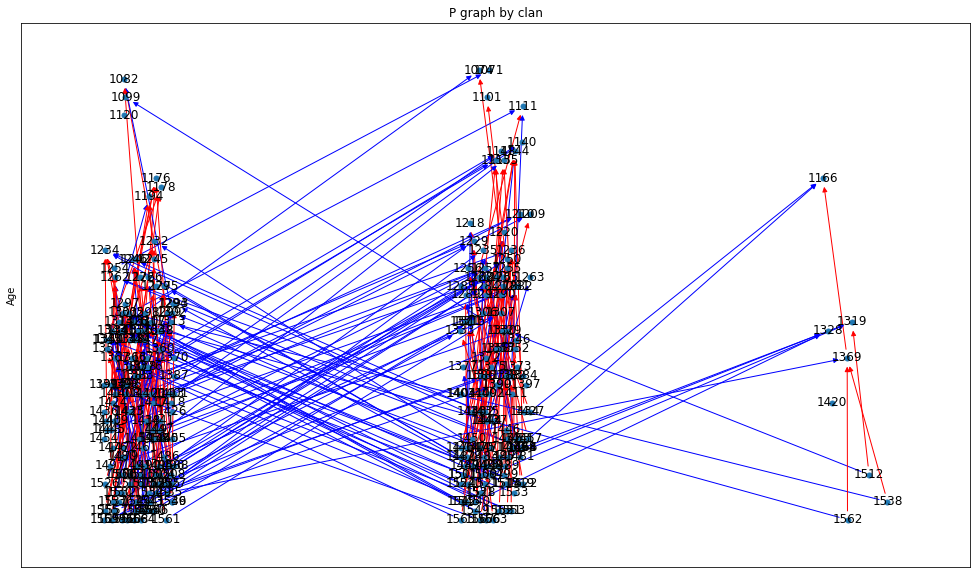

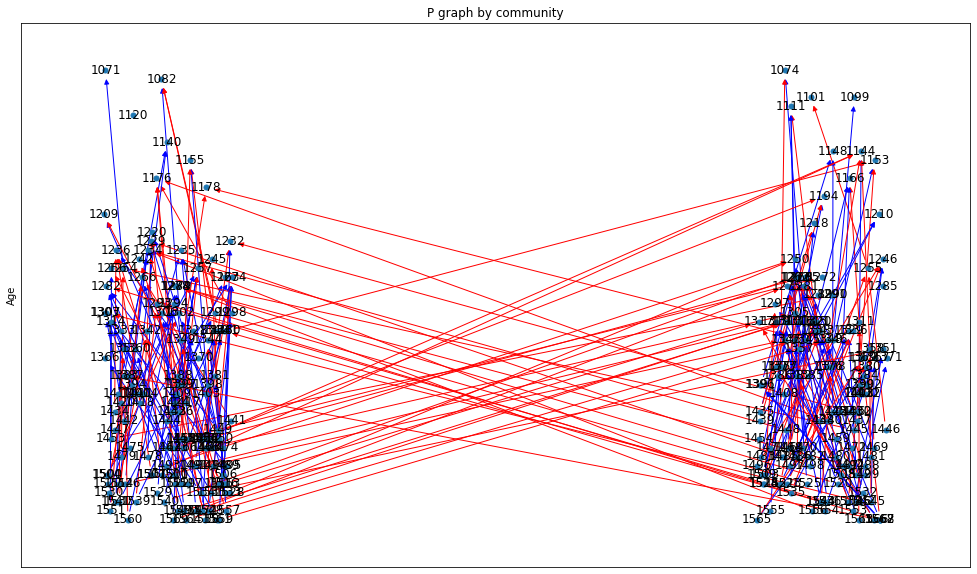

tamos en tiempo 400 con vivas 262


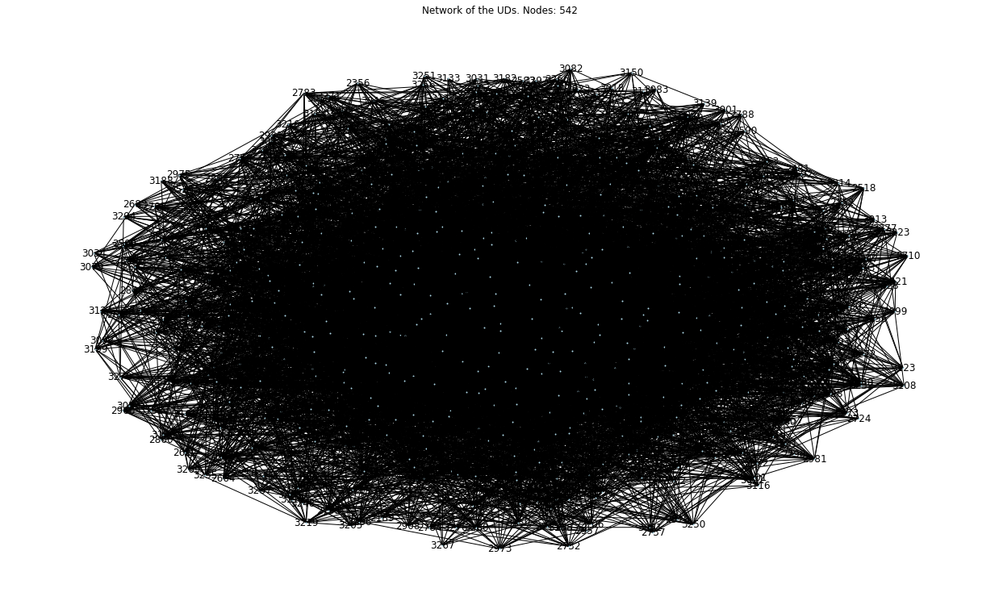

Betweenness Centrality:
{2760: 0.009458433103128066, 2770: 0.009376915534375035, 2920: 0.008813171494615251, 2796: 0.008314671647843955, 2733: 0.008285939496150519, 2959: 0.00791970354683567, 2764: 0.007908152970136388, 2950: 0.007781441181554988, 3132: 0.007527001479228454, 2666: 0.007330521954301549}

Closeness Centrality:
{2913: 0.4604255319148936, 2920: 0.45731191885038036, 2684: 0.45731191885038036, 2925: 0.45692567567567566, 2852: 0.4553872053872054, 2764: 0.45347862531433364, 2914: 0.45347862531433364, 2796: 0.4519632414369256, 2624: 0.451209341117598, 2862: 0.44821872410936203}

Degree Centrality:
{2920: 0.09611829944547134, 2684: 0.08872458410351201, 2852: 0.08872458410351201, 3077: 0.08502772643253234, 2760: 0.08317929759704251, 2693: 0.08133086876155268, 2859: 0.07948243992606284, 3291: 0.07948243992606284, 3132: 0.07948243992606284, 2959: 0.07763401109057301}

Eigenvector Centrality:
{2684: 0.11837122908194846, 2819: 0.11096720483464777, 2859: 0.10982419686911962, 3077: 0.1

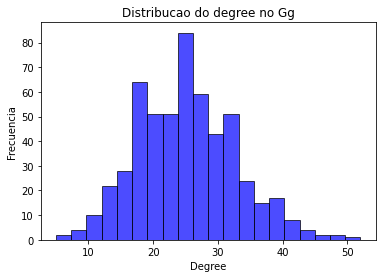

Densidade: 0.04649719325289371
Número de nós: 542
Número de aristas: 6817
Diámetro: 4
Transitividade: 0.372153585607596
Average shorthest path: 2.4642148269911535
Coeficiente de Clustering Promedio (cluster maior): 0.39162503958382183
----------------------------


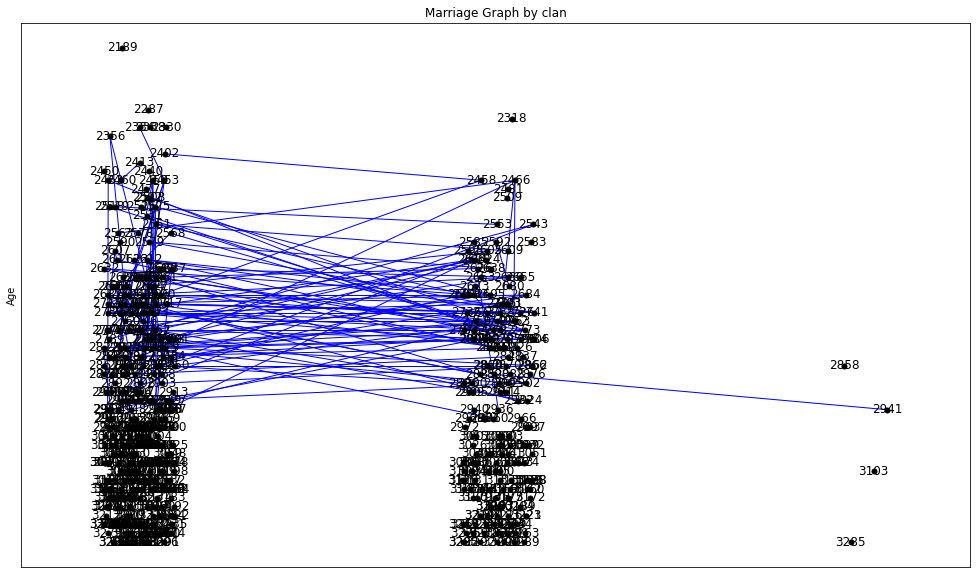

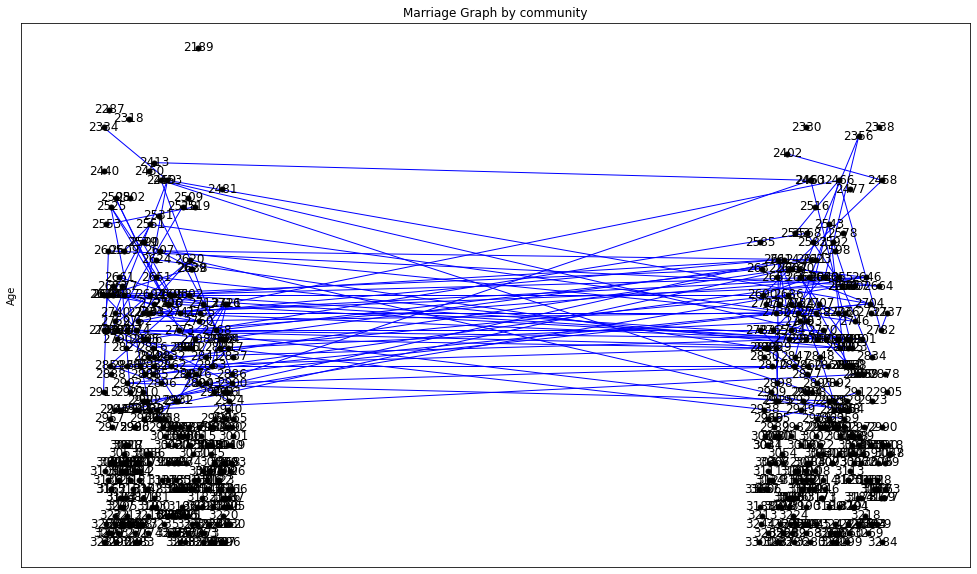

Total de enlaces: 146
Links inside the clan '1': 36.99%
Links inside the clan '2': 6.16%
Linkgs outside the clan '1' and '2': 31.51%
Linkgs outside the clan '2' and '1': 24.66%
Linkgs outside the clan '2' and '3': 0.68%
Total de enlaces: 146
Links inside the community '1': 34.25%
Links inside the community '2': 30.82%
Linkgs outside the community '1' and '2': 15.07%
Linkgs outside the community '2' and '1': 19.86%


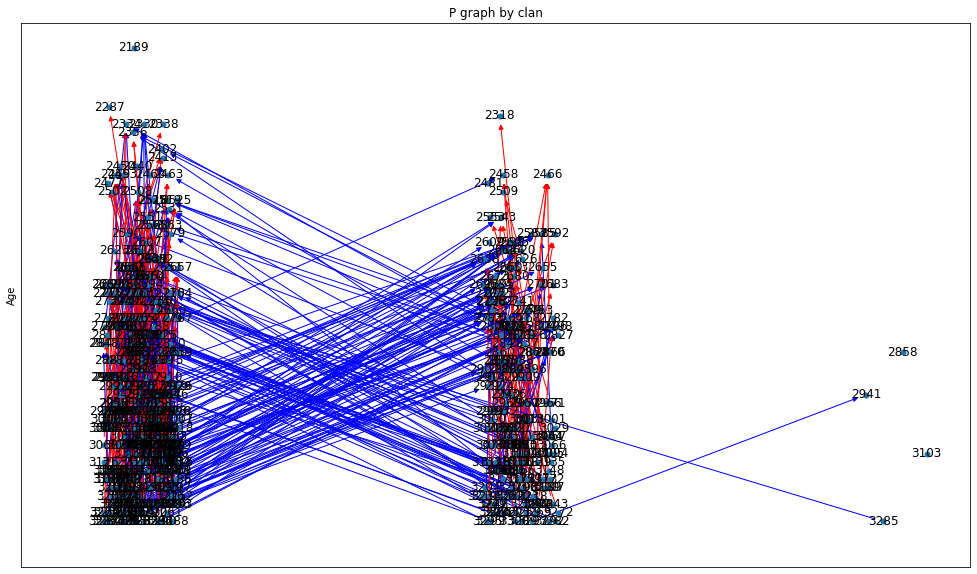

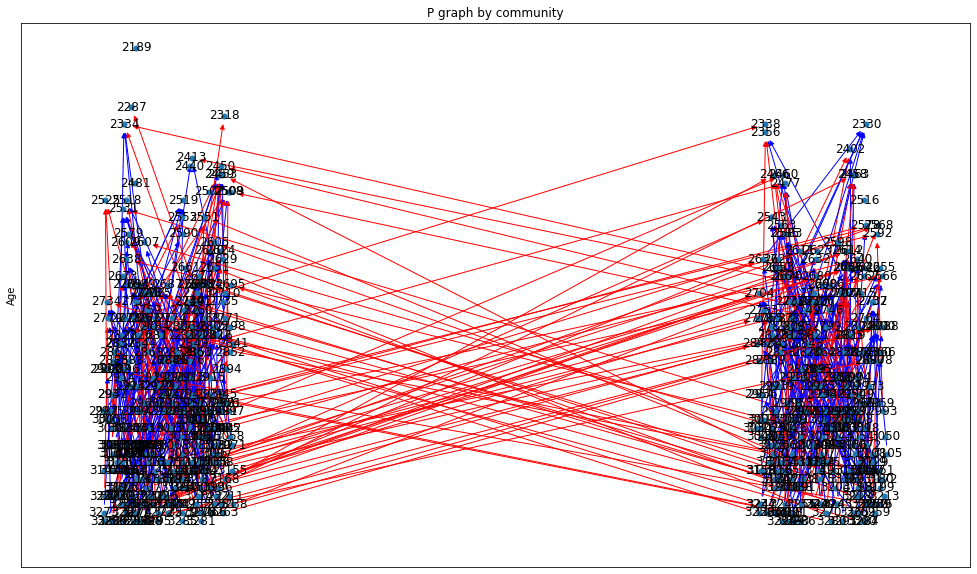

tamos en tiempo 500 con vivas 532


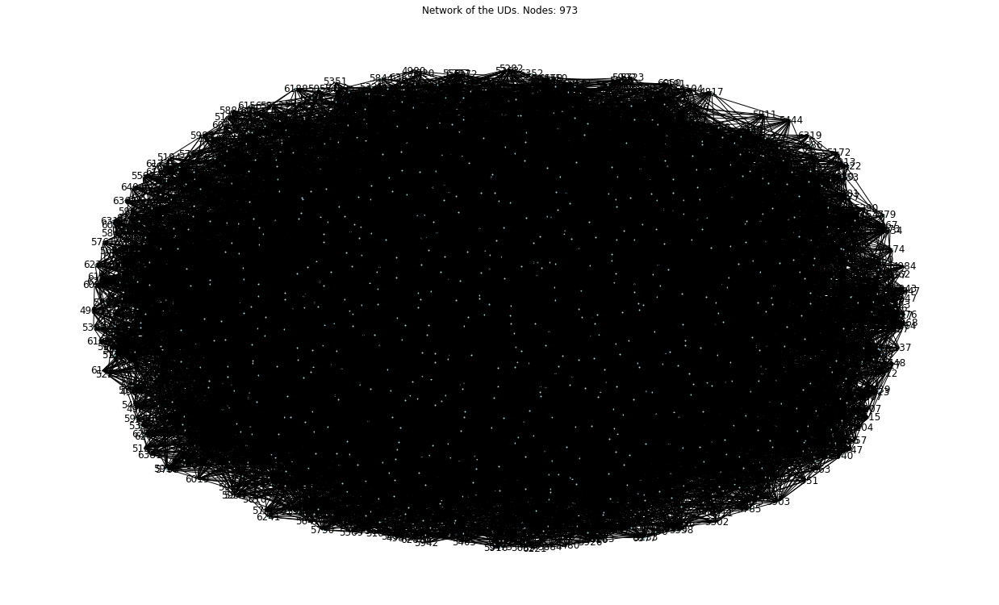

Betweenness Centrality:
{5523: 0.006127045088495228, 6365: 0.0059394456277101285, 5923: 0.0058667129308797765, 5399: 0.005598458880208102, 5412: 0.005396120136698286, 5934: 0.00515132634628742, 6010: 0.005015440263514877, 6232: 0.0047307769859623585, 5371: 0.004631763732337251, 5791: 0.004631508493937198}

Closeness Centrality:
{5412: 0.42408376963350786, 6365: 0.4187850064627316, 5923: 0.41842445114076626, 5371: 0.4178847807394669, 5523: 0.41467576791808874, 5604: 0.414498933901919, 5454: 0.414498933901919, 6108: 0.41308967275818104, 5399: 0.41151566469093986, 6010: 0.4113415150232755}

Degree Centrality:
{5412: 0.05967078189300412, 5523: 0.05761316872427984, 5371: 0.0565843621399177, 5923: 0.05452674897119342, 5934: 0.05349794238683128, 6010: 0.05246913580246914, 6108: 0.05246913580246914, 6365: 0.05246913580246914, 5399: 0.05246913580246914, 5454: 0.04938271604938272}

Eigenvector Centrality:
{5412: 0.10172462655302031, 6108: 0.0946755265636314, 5371: 0.09405830120814318, 5523: 0.09

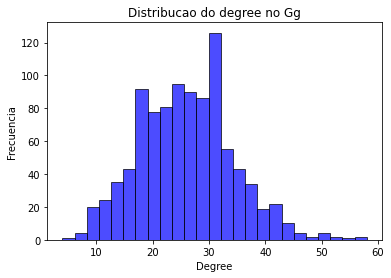

Densidade: 0.026742627062371266
Número de nós: 973
Número de aristas: 12646
Diámetro: 5
Transitividade: 0.37262161884192124
Average shorthest path: 2.6743980476994067
Coeficiente de Clustering Promedio (cluster maior): 0.39005516618474245
----------------------------


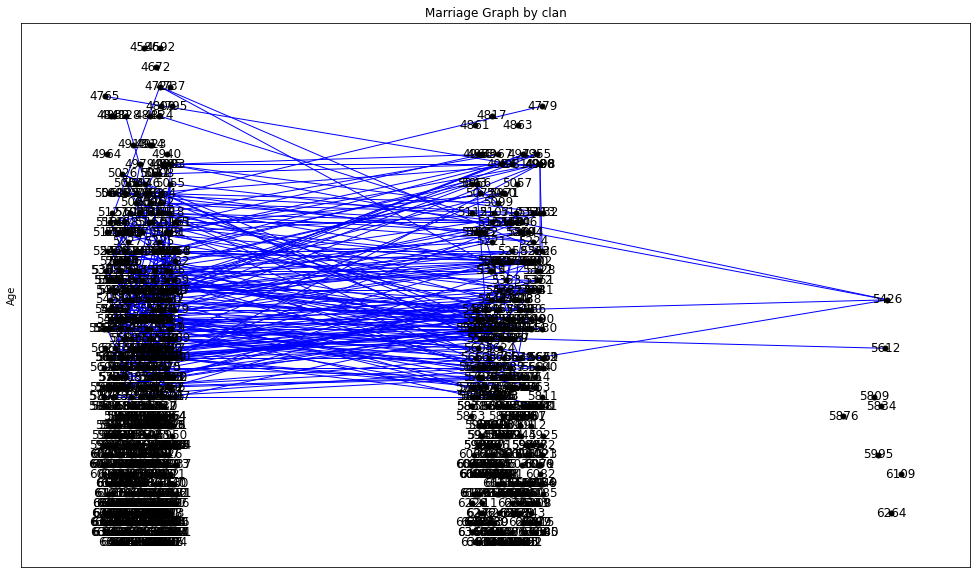

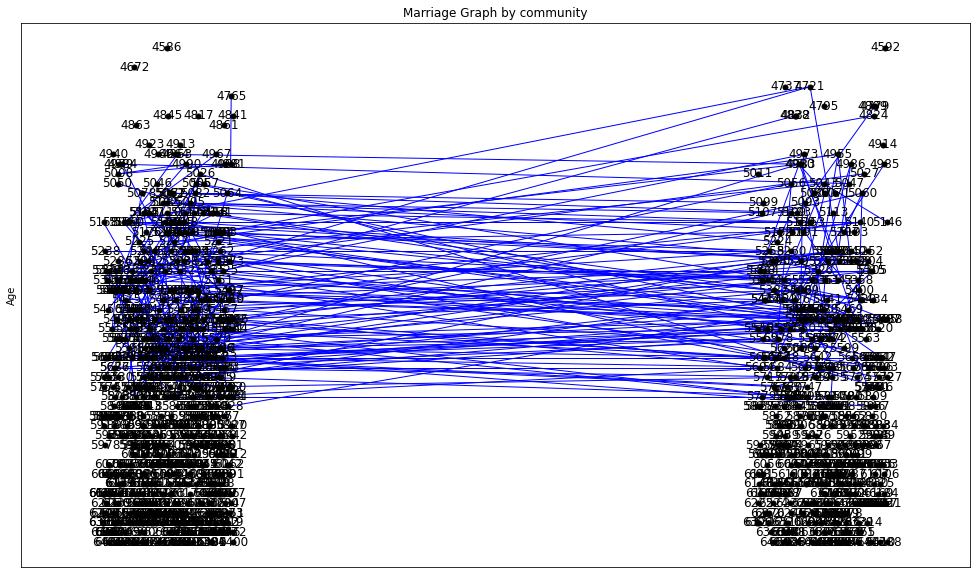

Total de enlaces: 327
Links inside the clan '1': 35.17%
Links inside the clan '2': 5.50%
Linkgs outside the clan '1' and '2': 29.36%
Linkgs outside the clan '2' and '1': 28.44%
Linkgs outside the clan '1' and '3': 0.31%
Linkgs outside the clan '2' and '3': 0.61%
Linkgs outside the clan '3' and '1': 0.31%
Linkgs outside the clan '3' and '2': 0.31%
Total de enlaces: 327
Links inside the community '2': 19.57%
Links inside the community '1': 44.95%
Linkgs outside the community '2' and '1': 16.21%
Linkgs outside the community '1' and '2': 19.27%


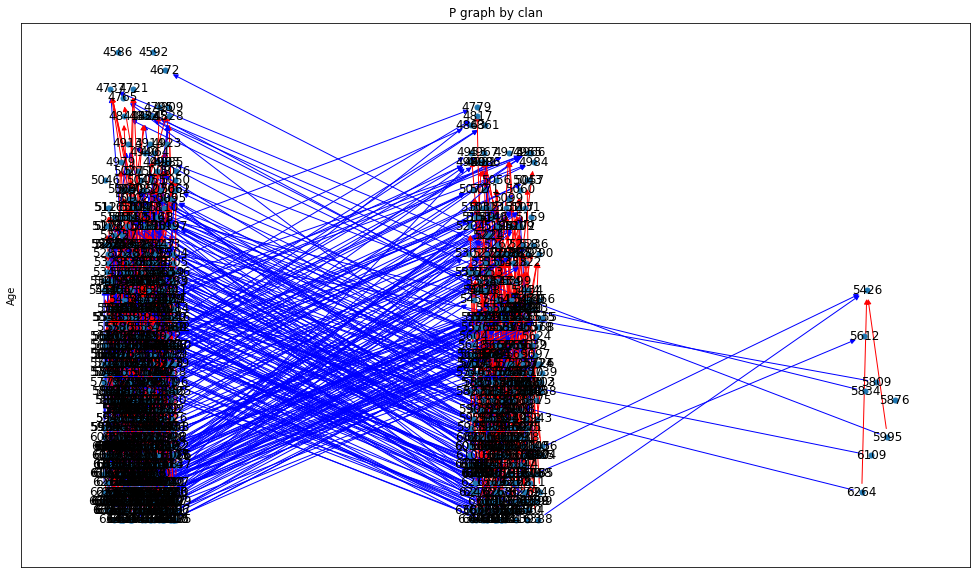

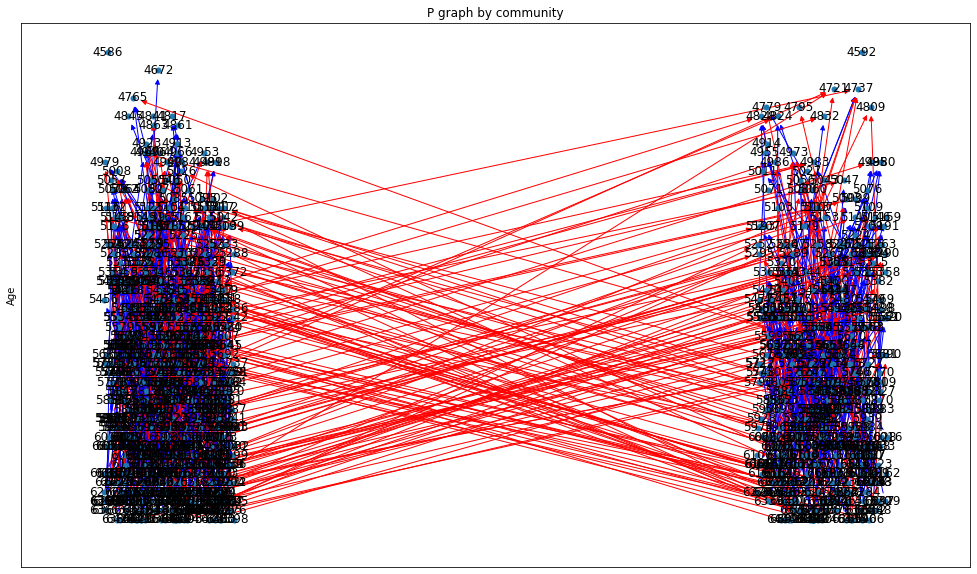

tamos en tiempo 600 con vivas 972


KeyboardInterrupt: 

In [2]:
#UD_restricted
#Parameters dual_organization
iniciais = 30 # Initial UD
clans = (list(range(1, 3 + 1)) * (iniciais // 3)) # Just 3 clans
communities = (list(range(1, 2 + 1)) * (iniciais // 2)) # Just 2 communities
random.shuffle(clans)
random.shuffle(communities)
prob_morte = 0.06 # Beta from the gutertz equation
media = 4 # Average children per UD
#random.seed(42) # Random seed
t = 700 #steps of the simulation
dataset = [] #For the data

#### Initialization dual_organization
## Communities
UD_restricted.uds = {}
instancias_ud = []
for id_ud in range(1, int(iniciais) + 1):
        instancias_ud.append(UD_restricted(id_ud, media, communities.pop(), clans.pop()))
## Varieties
limited_varieties = True
if limited_varieties == False:
    for id_ud, ud in UD_restricted.uds.items():
        for _ in range(5):
            ud.varieties.append(Variety())
else:
    initial_varieties = [Variety() for _ in range (10)]
    for ud in UD_restricted.uds.values():
        for _ in range(3):
            ud.varieties.append(random.choice(initial_varieties))
#### Simulation
vivas = [int(iniciais)]
for i in range (1, (t)):
    uds_copy = {id_ud: ud for id_ud, ud in UD_restricted.uds.items() if ud.activa}
    if not uds_copy:
        print("acabo")
        break
    for id_ud, ud in uds_copy.items():
        ud.ter_filho()
        ud.buscar_ud(media, 50, True, False)
        ud.incrementar_idade()
        ud.death_probability(prob_morte)
    if i % 100 == 0:
        create_vis_geral(uds_copy, True)
        Gcl = marriage_graph_attribute(uds_copy, "clan", False)
        Gco = marriage_graph_attribute(uds_copy, "community", False)
        # clan
        results_clan = count_links_between_and_within(Gcl, "clan")
        # community
        results_community = count_links_between_and_within(Gco, "community")
        p_graph_attribute(uds_copy, "clan", False)
        p_graph_attribute(uds_copy, "community", False)
        # Get the dyacronic data
        dataset = general_charactersitics_data(i, uds_copy, dataset, False, True)
        print(f"tamos en tiempo {i} con vivas {viv}")

    # Collecting data for populational dynamics
    viv = len([ud for id, ud in uds_copy.items() if ud.activa])
    vivas.append(viv)
        
print(len([ud for id, ud in uds_copy.items() if ud.activa]))
final = general_charactersitics_data(None, None, dataset, final = True, clan = True)

In [ ]:
final

In [ ]:
def select_new_ud (selected_ud, uds_disponiveis): #selected_ud es un objeto ud
    peso_clan, pes_com = 0.8 , 0.2
    if len(uds_disponiveis) != 0: #If there are possible mates
        probabilidad = np.zeros(len(uds_disponiveis))
        for i, obj in enumerate(uds_disponiveis):
            #clan_val = 0.1 if obj.clan == selected_ud.clan else 0.9
            clan_val = 0.9 if restrict(obj.clan, selected_ud.clan) else 0.1
            com_val = 0.9 if obj.community == selected_ud.community else 0.1
            probabilidad[i] = clan_val*peso_clan + com_val*pes_com
        probabilidad = probabilidad / np.sum(probabilidad)
        choosen_ud = np.random.choice(uds_disponiveis, p=probabilidad)    
        return choosen_ud
    else:
        return False

0.9